## *Data Cleaning*
- This step involves checking for loop holes in our data and correcting them such as:
    - Missing rows
    - Verifying the data types of our columns
    - Duplicated rows
    - Checking for outliers

- It's a very crucial step since the kind of analysis we will be able to do is going to be just as good as the kind of data we are going to use for building the visuals.

In [1]:
# Installing the necessary dependencies
import pandas as pd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import seaborn as sns

In [2]:
# Loading our data
df = pd.read_csv("HDHI Admission data.csv", index_col=0)

In [3]:
# Checking the data types of the columns.
df[df.columns].dtypes

MRD No.                            object
D.O.A                              object
D.O.D                              object
AGE                                 int64
GENDER                             object
RURAL                              object
TYPE OF ADMISSION-EMERGENCY/OPD    object
month year                         object
DURATION OF STAY                    int64
duration of intensive unit stay     int64
OUTCOME                            object
SMOKING                             int64
ALCOHOL                             int64
DM                                  int64
HTN                                 int64
CAD                                 int64
PRIOR CMP                           int64
CKD                                 int64
HB                                 object
TLC                                object
PLATELETS                          object
GLUCOSE                            object
UREA                               object
CREATININE                        

In [4]:
# Converting date columns to Datetime dtypes.
df["D.O.A"] = pd.to_datetime(df["D.O.A"], errors="coerce", dayfirst=True)
df["D.O.D"] = pd.to_datetime(df["D.O.D"], errors="coerce", dayfirst=True)
df["month year"] = pd.to_datetime(df["month year"], format="%b-%y", errors="coerce")


# Converting object to numeric_columns
object_columns = ['MRD No.', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA',
       'CREATININE', 'BNP', 'EF', 'CHEST INFECTION']

for col in object_columns:
    df[col] = pd.to_numeric(df[col], errors="coerce")


In [5]:
# Encoding non-numeric variables.
df.loc[:, 'TYPE OF ADMISSION-EMERGENCY/OPD'] = df['TYPE OF ADMISSION-EMERGENCY/OPD'].map({'E': 0, 'O': 1})
df.loc[:, 'GENDER'] = df['GENDER'].map({'M': 0, 'F': 1})
df.loc[:, 'RURAL'] = df['RURAL'].map({'R': 0, 'U': 1})
df = pd.get_dummies(df, columns=['OUTCOME'], drop_first=False)
df


,MRD No.,D.O.A,D.O.D,AGE,GENDER,RURAL,TYPE OF ADMISSION-EMERGENCY/OPD,month year,DURATION OF STAY,duration of intensive unit stay,...,ORTHOSTATIC,INFECTIVE ENDOCARDITIS,DVT,CARDIOGENIC SHOCK,SHOCK,PULMONARY EMBOLISM,CHEST INFECTION,OUTCOME_DAMA,OUTCOME_DISCHARGE,OUTCOME_EXPIRY
SNO,,,,,,,,,,,,,,,,,,,,,
1,234735.0,2017-01-04,2017-03-04,81,0,0,0,2017-04-01,3,2,...,0,0,0,0,0,0,0.0,False,True,False
2,234696.0,2017-01-04,2017-05-04,65,0,0,0,2017-04-01,5,2,...,0,0,0,0,0,0,0.0,False,True,False
3,234882.0,2017-01-04,2017-03-04,53,0,1,0,2017-04-01,3,3,...,0,0,0,0,0,0,0.0,False,True,False
4,234635.0,2017-01-04,2017-08-04,67,1,1,0,2017-04-01,8,6,...,0,0,0,0,0,0,0.0,False,True,False
5,234486.0,2017-01-04,NaT,60,1,1,0,2017-04-01,23,9,...,0,0,0,0,0,0,0.0,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15753,699585.0,2019-03-31,2019-04-04,86,1,1,1,2019-03-01,5,1,...,0,0,0,0,0,0,0.0,False,True,False
15754,699500.0,NaT,2019-01-04,50,0,0,0,2019-03-01,2,2,...,0,0,0,0,0,0,0.0,False,False,True
15755,700415.0,2019-03-31,2019-04-09,82,0,1,0,2019-03-01,10,5,...,0,0,0,0,0,0,0.0,False,True,False


In [6]:
df.rename(columns={"RURAL": "Location"}, inplace=True)

In [7]:
# Confirming the change.
df[df.columns].dtypes

MRD No.                                   float64
D.O.A                              datetime64[ns]
D.O.D                              datetime64[ns]
AGE                                         int64
GENDER                                     object
Location                                   object
TYPE OF ADMISSION-EMERGENCY/OPD            object
month year                         datetime64[ns]
DURATION OF STAY                            int64
duration of intensive unit stay             int64
SMOKING                                     int64
ALCOHOL                                     int64
DM                                          int64
HTN                                         int64
CAD                                         int64
PRIOR CMP                                   int64
CKD                                         int64
HB                                        float64
TLC                                       float64
PLATELETS                                 float64


In [8]:
# Checking for duplicate rows
df = df.drop_duplicates()

In [9]:
# Imputing missing data with median
for col in df.select_dtypes(include=['float64', 'int64', 'datetime64[ns]']):
    df.loc[:, col] = df[col].fillna(df[col].median())



In [10]:
# Summary statistics.
numeric_cols = df.select_dtypes(include=['float64','int64']).columns
summary = pd.DataFrame({
    'Mean': df[numeric_cols].mean(),
    'Median': df[numeric_cols].median(),
    'Std': df[numeric_cols].std(),
    'Min': df[numeric_cols].min(),
    'Max': df[numeric_cols].max(),
    'Variance': df[numeric_cols].var()
})
summary

,Mean,Median,Std,Min,Max,Variance
MRD No.,407774.317479,400037.5,198982.087925,506.000,6408503.00,3.959387e+10
AGE,61.420840,62.0,13.425534,4.000,110.00,1.802450e+02
DURATION OF STAY,6.381580,5.0,4.996840,1.000,98.00,2.496841e+01
duration of intensive unit stay,3.781109,3.0,3.995571,0.000,58.00,1.596459e+01
SMOKING,0.052168,0.0,0.222373,0.000,1.00,4.944988e-02
ALCOHOL,0.067025,0.0,0.250074,0.000,1.00,6.253704e-02
DM,0.331429,0.0,0.470743,0.000,1.00,2.215986e-01
HTN,0.485042,0.0,0.499793,0.000,1.00,2.497931e-01
CAD,0.666824,1.0,0.471365,0.000,1.00,2.221848e-01
PRIOR CMP,0.155832,0.0,0.362708,0.000,1.00,1.315572e-01


#### *Outliers*
- I have avoided removing outliers since this is medical data and the abnormal values could be clinically possible
as much as they are abnormal.

### *Exploratory Data Analysis*
- Now that the data is clean we can move into EDA to visualize trends and patterns in the data -- information that 
will be crucial for decision making

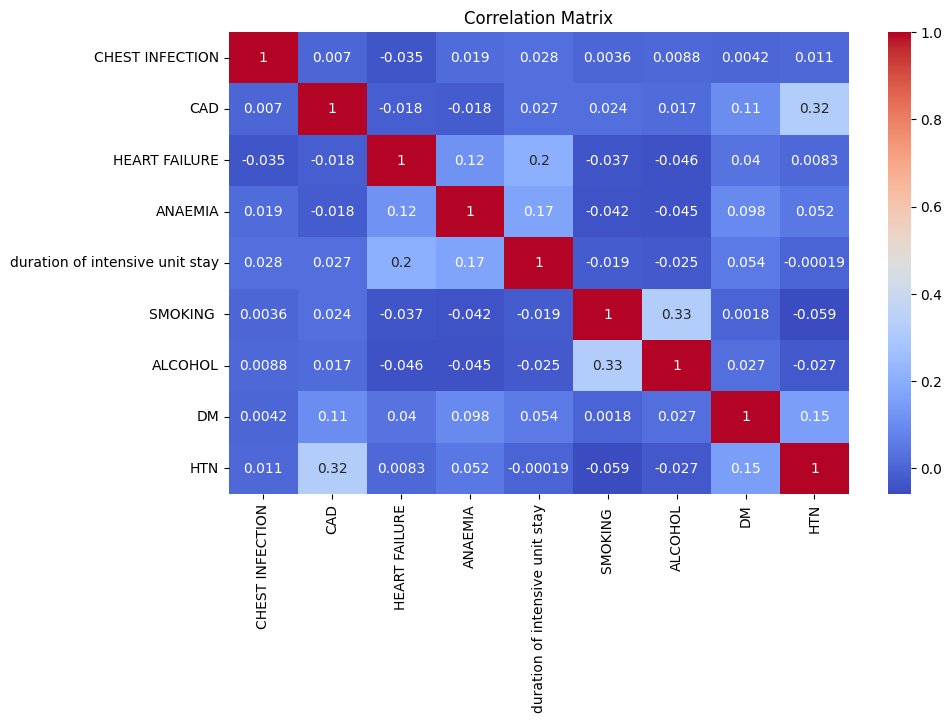

In [11]:
# Correlation Matrix.
cols = ['CHEST INFECTION','CAD','HEART FAILURE','ANAEMIA','duration of intensive unit stay', 'SMOKING ', 'ALCOHOL', 'DM', 'HTN']
corr = df[cols].corr()
plt.figure(figsize=(10,6))
sns.heatmap(corr, cmap="coolwarm", annot=True)
plt.title("Correlation Matrix")
plt.show()

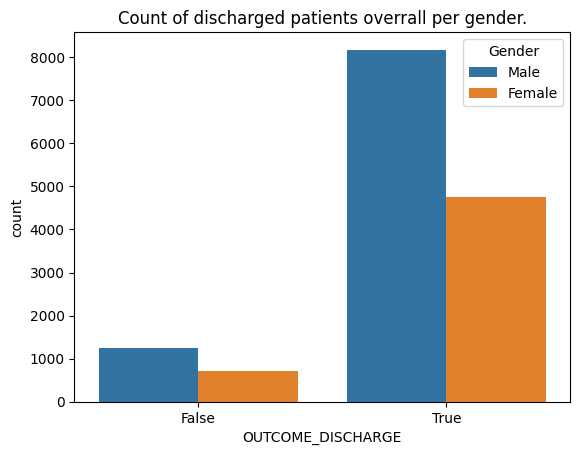

In [12]:
# Distribution of Discharged patients per gender.
sns.countplot(x='OUTCOME_DISCHARGE', hue='GENDER', hue_order=[0,1], data=df)
plt.title("Count of discharged patients overrall per gender.")
plt.legend(title="Gender", labels=["Male", "Female"])
plt.show()


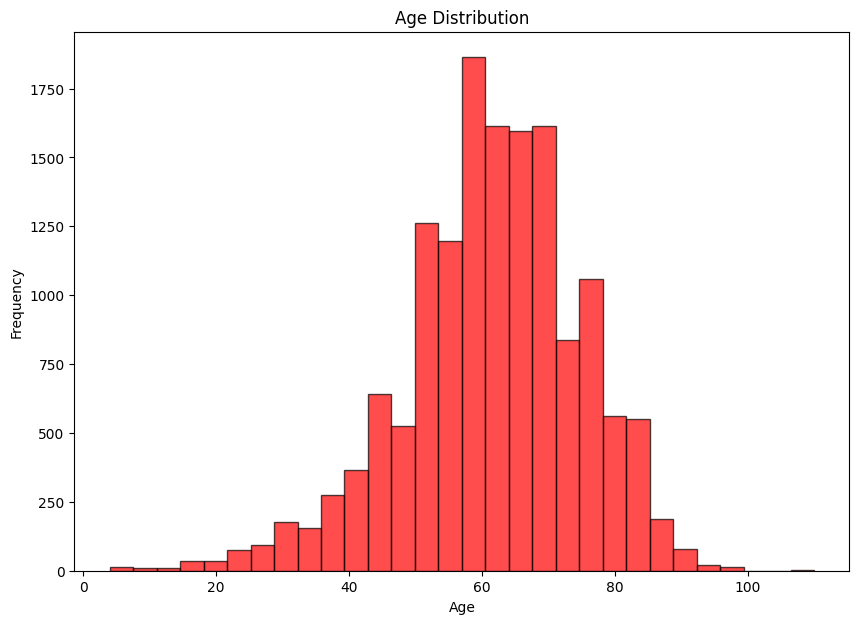

Maximum Age is : 110
Minimum Age is : 4


In [13]:
# Age Distribution 
plt.figure(figsize=(10, 7))
plt.hist(x=df["AGE"], bins=30, alpha=0.7, color="red", edgecolor="black")
plt.title("Age Distribution")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.show()

# Maximum and minimum ages
print(f'Maximum Age is : {df["AGE"].max()}')
print(f'Minimum Age is : {df["AGE"].min()}')



In [14]:
# Distribution of diseases in the two locations.
disease_columns = ['DM', 'HTN',
       'CAD', 'PRIOR CMP', 'CKD', 'HB', 'TLC', 'BNP', 'RAISED CARDIAC ENZYMES', 'EF', 'SEVERE ANAEMIA',
       'ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI', 'ATYPICAL CHEST PAIN',
       'HEART FAILURE', 'HFREF', 'HFNEF', 'VALVULAR', 'CHB', 'SSS', 'AKI',
       'DVT', 'CARDIOGENIC SHOCK', 'SHOCK', 'PULMONARY EMBOLISM',
       'CHEST INFECTION']

disease_by_location = df.groupby("Location")[disease_columns].sum().sort_values(by="Location", ascending=False)
disease_by_location
# Location 0 - Rural, 1 - Urban


,DM,HTN,CAD,PRIOR CMP,CKD,HB,TLC,BNP,RAISED CARDIAC ENZYMES,EF,...,HFNEF,VALVULAR,CHB,SSS,AKI,DVT,CARDIOGENIC SHOCK,SHOCK,PULMONARY EMBOLISM,CHEST INFECTION
Location,,,,,,,,,,,,,,,,,,,,,
1,3850,5616,7710,1714,1134,138147.90,131268.1000,6968698.0,2371,491667.4,...,1528,400,279,78,2550,143,696,553,148,259.0
0,1080,1599,2209,604,345,43845.24,40437.2378,2257873.9,625,151495.0,...,471,149,103,25,800,55,231,176,81,72.0


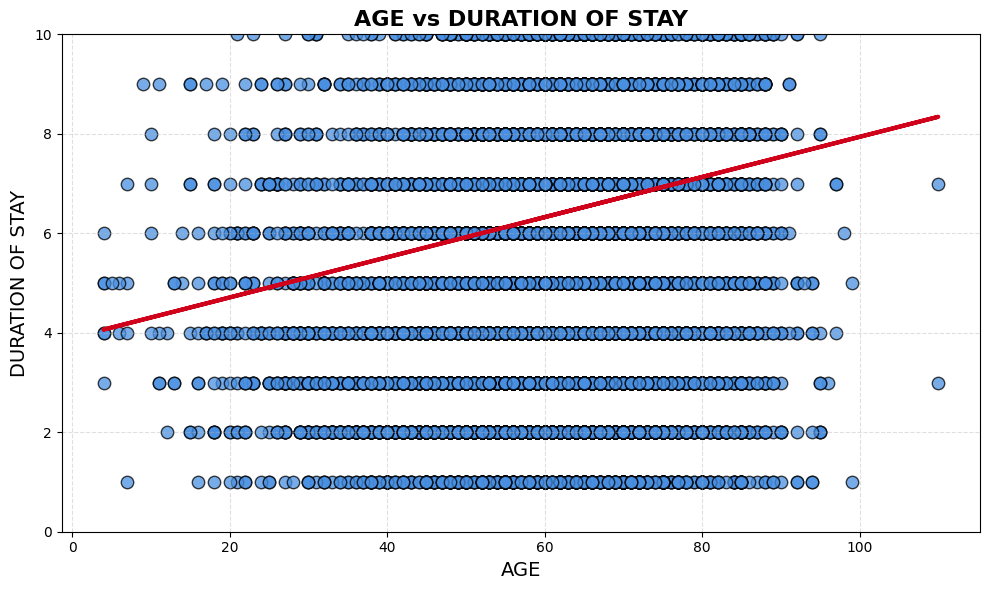

In [15]:
import numpy as np
x = df["AGE"]
y = df["DURATION OF STAY"]

# Linear regression
m, b = np.polyfit(x, y, 1)
y_pred = m * x + b

plt.figure(figsize=(10, 6))

# Scatter points (larger, softer color, nice edge)
plt.scatter(x, y, s=80, color="#4a90e2", edgecolor="black", alpha=0.75)

# Regression line (thicker + contrasting color)
plt.plot(x, y_pred, color="#d0021b", linewidth=3, label="Best Fit Line")

# Grid (light)
plt.grid(True, linestyle="--", alpha=0.4)

# Axis labels, title
plt.xlabel("AGE", fontsize=14)
plt.ylabel("DURATION OF STAY", fontsize=14)
plt.title("AGE vs DURATION OF STAY", fontsize=16, fontweight="bold")

# Choose dynamic y-limits (or keep your manual one)
plt.ylim(0,10)

# Improve layout
plt.tight_layout()

plt.show()

C:\Users\USER-1\AppData\Local\Temp\ipykernel_12984\2678183229.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = pd.to_datetime(df['D.O.A']).dt.month


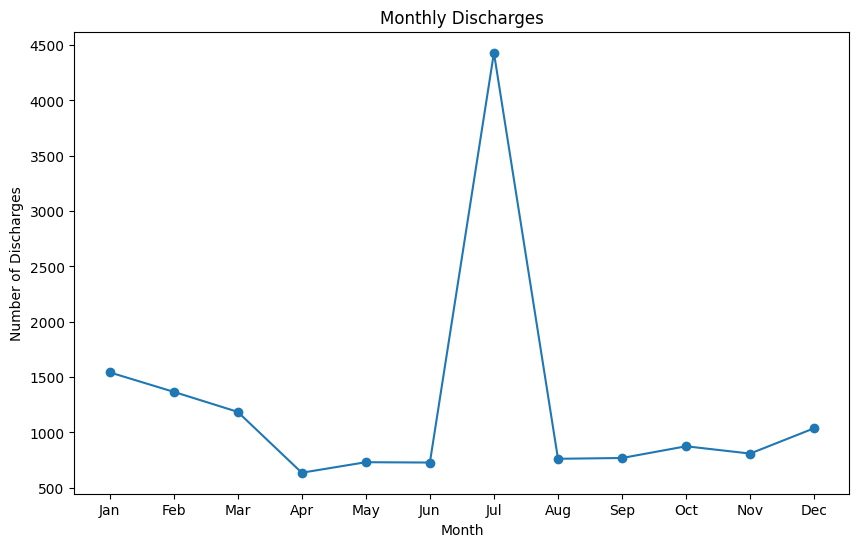

In [16]:
# Distribution of Monthly Discharges.
import calendar

df['month'] = pd.to_datetime(df['D.O.A']).dt.month
monthly_counts = df.groupby('month')['OUTCOME_DISCHARGE'].count()

plt.figure(figsize=(10,6))
plt.plot(monthly_counts.index, monthly_counts.values, marker='o')
plt.xticks(ticks=range(1,13), labels=[calendar.month_abbr[i] for i in range(1,13)])
plt.xlabel("Month")
plt.ylabel("Number of Discharges")
plt.title("Monthly Discharges")
plt.show()


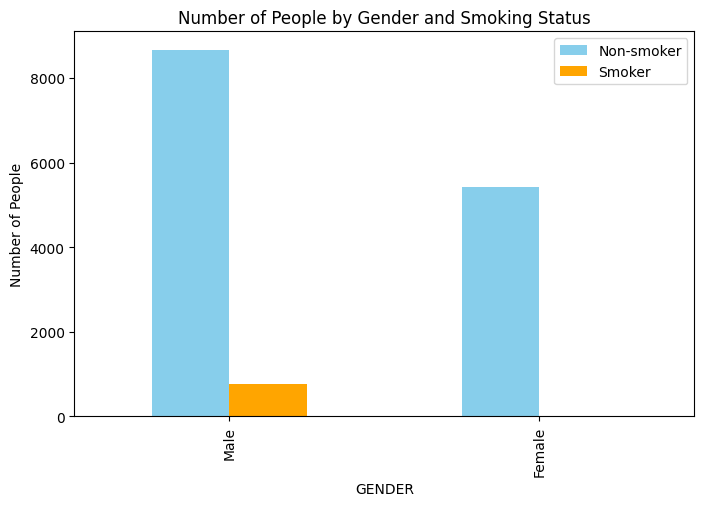

In [17]:
counts = df.groupby(['GENDER', 'SMOKING '])['MRD No.'].count()

counts.unstack().plot(kind='bar', figsize=(8,5), color=['skyblue','orange']).legend(["Non-smoker", "Smoker"])
plt.ylabel("Number of People")
plt.title("Number of People by Gender and Smoking Status")
plt.xticks([0, 1], ["Male", "Female"])
plt.show()


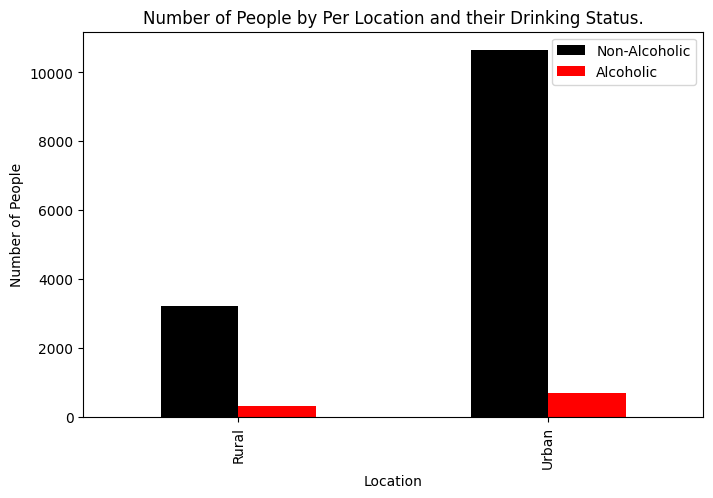

In [18]:
# Smoking status per location.
location_count = df.groupby(["Location", "ALCOHOL"])["MRD No."].count()
ax = location_count.unstack().plot(kind='bar', figsize=(8,5), color=['black','red'])
ax.legend(["Non-Alcoholic", "Alcoholic"])
plt.ylabel("Number of People")
plt.title("Number of People by Per Location and their Drinking Status.")
plt.xticks([0, 1], ["Rural", "Urban"])
plt.show()

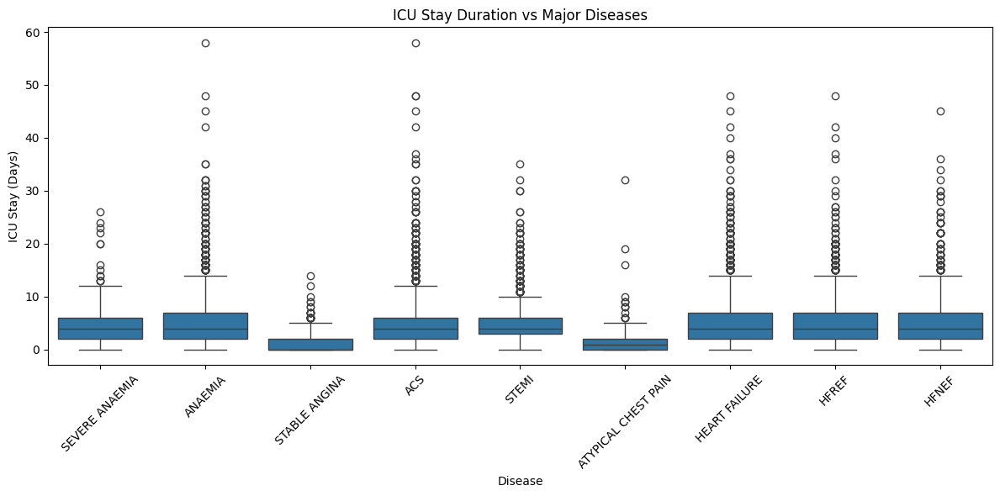

In [19]:
# ICU Stay days for major diseases.
major_diseases = ['SEVERE ANAEMIA','ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI', 'ATYPICAL CHEST PAIN','HEART FAILURE', 'HFREF', 'HFNEF']
plt.figure(figsize=(12,6))

df_melt = df.melt(id_vars=['duration of intensive unit stay'],
                  value_vars=major_diseases,
                  var_name='Disease',
                  value_name='Has_Disease')

sns.boxplot(
    data=df_melt[df_melt['Has_Disease'] == 1], 
    x='Disease', 
    y='duration of intensive unit stay'
)

plt.title("ICU Stay Duration vs Major Diseases")
plt.ylabel("ICU Stay (Days)")
plt.xlabel("Disease")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\USER-1\AppData\Local\Temp\ipykernel_12984\2005085496.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, "Year"] = df["month year"].dt.year


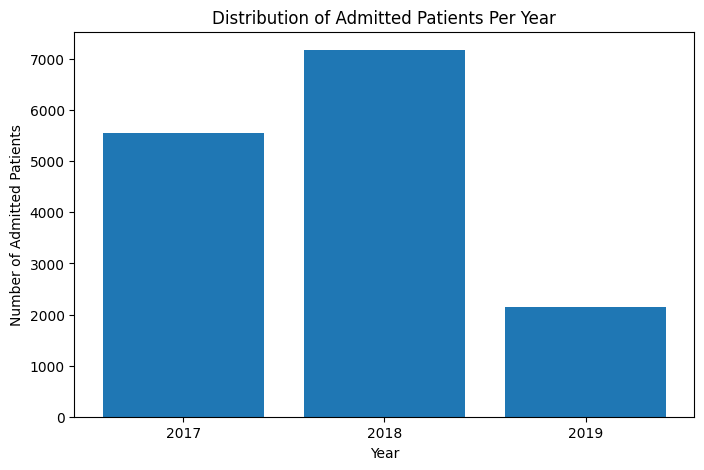

In [20]:
# Patients admitted per year
df.loc[:, "Year"] = df["month year"].dt.year

data = df.groupby("Year")['D.O.A'].count()

plt.figure(figsize=(8,5))
plt.bar(data.index, data.values)
plt.xlabel("Year")
plt.ylabel("Number of Admitted Patients")
plt.title("Distribution of Admitted Patients Per Year")
plt.xticks(data.index)
plt.show()


## Diseases Full Names
- SEVERE ANAEMIA
- ANAEMIA
- STABLE ANGINA
- Acute Coronary Syndrome
- ST ELEVATION MYOCARDIAL INFARCTION
- ATYPICAL CHEST PAIN
- HEART FAILURE
- HEART FAILURE WITH REDUCED EJECTION FRACTION
- HEART FAILURE WITH NORMAL EJECTION FRACTION
- Diabetes Mellitus
- Hypertension
- Coronary Artery Disease

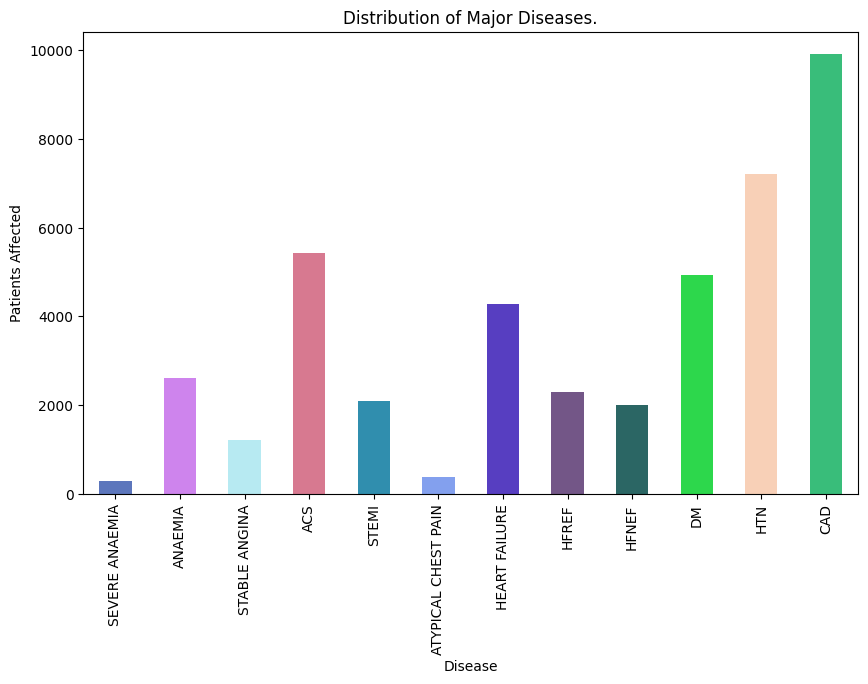

In [21]:
# Bar plot for count of the major diseases.
chronic_diseases =['SEVERE ANAEMIA','ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI', 'ATYPICAL CHEST PAIN','HEART FAILURE', 'HFREF', 'HFNEF',
                   'DM', 'HTN', 'CAD']
disease_count = df[chronic_diseases].sum()

colors = np.random.rand(len(disease_count), 3)
disease_count.plot(kind='bar', figsize=(10,6), color=colors)
plt.title("Distribution of Major Diseases.")
plt.xlabel("Disease")
plt.ylabel("Patients Affected")
plt.show()

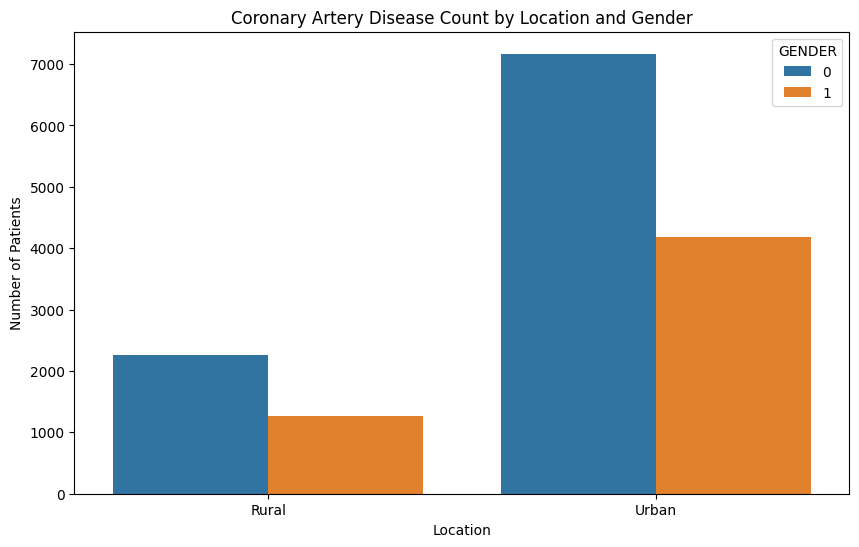

In [22]:
ax = df.groupby(["Location", "GENDER"])["CAD"].count()
ax_df = ax.reset_index()
plt.figure(figsize=(10,6))
sns.barplot(data=ax_df, x="Location", y="CAD", hue="GENDER")
plt.title("Coronary Artery Disease Count by Location and Gender")
plt.ylabel("Number of Patients")
plt.xticks([0, 1], ["Rural", "Urban"])
plt.legend(title="GENDER")
plt.show()


In [23]:
profile = ProfileReport(df, title="Admission Data EDA Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 59/59 [00:00<00:00, 65.16it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
# Exporting to a html file.
profile.to_file("EDA_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]